# Visualize the Population

Here we will visualize our UK population data using cuXfilter.

We import `cudf` as usual, plus `cuxfilter`, which we will be using to visualize the UK population data.

In [1]:
import cudf

import cuxfilter as cxf

Here we load into a cuDF dataframe the grid coordinates and county from the England/Wales population data that we manipulated earlier.

In [2]:
gdf = cudf.read_csv('./data/pop_2-02.csv', usecols=['easting', 'northing', 'county'])
print(gdf.dtypes)
gdf.shape

county       object
northing    float64
easting     float64
dtype: object


(58479894, 3)

In [3]:
gdf.head()

,county,northing,easting
0,Darlington,515491.5313,430772.1875
1,Darlington,503572.4688,434685.8750
2,Darlington,517903.6563,432565.5313
3,Darlington,517059.9063,427660.6250
4,Darlington,509228.6875,425527.7813


## Factorizing Counties

cuXfilter widgets enable us to select entries from an integer column. To make that column, we can use cuDF's `factorize` method to convert a string column into an integer column, while keeping a map from the new integers to the old strings.

`factorize` produces the integer column and corresponding map as output, and we overwrite the old string column with the new integer column here. Alternatively, we could have appended the integer column as a new column, but the integer column is much more memory-efficient than the equivalent string column, and so we will often prefer to overwrite.

In [4]:
gdf['county'], county_names = gdf['county'].factorize()
gdf.head()

,county,northing,easting
0,37,515491.5313,430772.1875
1,37,503572.4688,434685.8750
2,37,517903.6563,432565.5313
3,37,517059.9063,427660.6250
4,37,509228.6875,425527.7813


The `county_names` Series is indexed by the integers that `factorize` created. The cuXfilter widget requires a dictionary to map from the integers to the strings, so we convert the index to a list, zip it together with the strings, and make the result into a dictionary. We use the `values_host` representation to make both the index and values iterable for the Python `zip` function. Since they should be small lists (to be a useful widget) we aren't worried about this taking significant time; alternatively, we could use the `to_arrow()` and `as_py()` methods in sequence to convert them to standard python objects before zipping.

In [5]:
county_map = dict(enumerate(county_names.to_array().flatten()))
county_map[37]

'Darlington'

## Visualizing Population Density and Distribution

Using cuXfilter has three main steps:
1. Associate a data source with cuXfilter
2. Define the charts and widgets to use with the data
3. Create and show a dashboard containing those charts and widgets

### Associating a Data Source with cuXfilter

We need to know what our data source's column names will be for the next step, so it is usually helpful to define the data source first. However, note that the data source is not used in the *Define Charts and Widgets* step below--the same charts and widgets can be used with different data sources with the same column names!

In [6]:
cxf_data = cxf.DataFrame.from_dataframe(gdf)

### Defining Charts and Widgets

We fix the chart `width` and then use the fact that `easting` and `northing` are both in meters to scale the chart `height` appropriately.

We also see how we will use the `county_map` made in the last step: it lets cuXfilter know how to display the selection widget, which is operating on the integer column behind the scenes.

In [7]:
chart_width = 600
scatter_chart = cxf.charts.datashader.scatter(x='easting', y='northing', 
                                              width=chart_width, 
                                              height=int((gdf['northing'].max() - gdf['northing'].min()) / 
                                                         (gdf['easting'].max() - gdf['easting'].min()) *
                                                          chart_width))

county_widget = cxf.charts.panel_widgets.multi_select('county', label_map=county_map)

At this point, we provide a list of the elements that we want on the dashboard and can provide it parameters that determine its appearance.

In [8]:
dash = cxf_data.dashboard([scatter_chart, county_widget], theme=cxf.themes.dark, data_size_widget=True)

Then, we can view individual charts non-interactively as a preview...

In [9]:
scatter_chart.view()

Card(sizing_mode='stretch_both', title='Scatter plot f..., width=600)
    [0] Bokeh(Figure)

And finally, push the whole dashboard up for interactive cross-filtering. To do so, we will need the IP address of the machine we are working on, which you can get by executing the next cell...

In [13]:
%%js
var host = window.location.host;
element.innerText = "'http://"+host+"'";

<IPython.core.display.Javascript object>

We set `my_url` in the next cell to the value just printed, making sure to include the quotes. 

In [ ]:
my_url = 'http://ec2-3-236-214-70.compute-1.amazonaws.com'
dash.show(my_url + "/lab", port=8789)

... and you can run the next cell to generate a link to the dashboard:

In [15]:
%%js
var host = window.location.host;
var url = 'http://'+host+'/lab/proxy/8789/';
element.innerHTML = '<a style="color:blue;" target="_blank" href='+url+'>Open Dashboard</a>';

<IPython.core.display.Javascript object>

Finally, once you are done with the dashboard, run the next cell to end it:

In [16]:
dash.stop()

# K-Means

Here we will use GPU-accelerated K-means to find the best locations for a fixed number of humanitarian supply airdrop depots.

For the first time we import `cuml`, the RAPIDS GPU-accelerated library containing many common machine learning algorithms. We will be visualizing the results of your work in this notebook, so we also import `cuxfilter`.

In [3]:
import cudf
import cuml

import cuxfilter as cxf

For this notebook we load again the cleaned UK population data--in this case, we are not specifically looking at counties, so we omit that column and just keep the grid coordinate columns.

In [4]:
gdf = cudf.read_csv('./data/pop_2-03.csv', usecols=['easting', 'northing'])
print(gdf.dtypes)
gdf.shape

northing    float64
easting     float64
dtype: object


(58479894, 2)

In [5]:
gdf.head()

,northing,easting
0,515491.5313,430772.1875
1,503572.4688,434685.8750
2,517903.6563,432565.5313
3,517059.9063,427660.6250
4,509228.6875,425527.7813


## K-Means Clustering

The unsupervised K-means clustering algorithm will look for a fixed number *k* of centroids in the data and clusters each point with its closest centroid. K-means can be effective when the number of clusters *k* is known or has a good estimate (such as from a model of the underlying mechanics of a problem).

Assume that in addition to knowing the distribution of the population, which we do, we would like to estimate the best locations to build a fixed number of humanitarian supply depots from which we can perform airdrops and reach the population most efficiently. We can use K-means, setting *k* to the number of supply depots available and fitting on the locations of the population, to identify candidate locations.

GPU-accelerated K-means is just as easy as its CPU-only scikit-learn counterpart. In this series of exercises, you will use it to optimize the locations for 5 supply depots.

## Making a `KMeans` Instance for 5 Clusters

`cuml.KMeans()` will initialize a K-means instance. Use it now to initialize a K-means instance called `km`, passing the named argument `n_clusters` set equal to our desired number `5`:

In [6]:
km = cuml.KMeans(n_clusters=5)

## Fitting to Population

Use the `km.fit` method to fit `km` to the population's locations by passing it the population data. After fitting, add the cluster labels back to the `gdf` in a new column named `cluster`. Finally, you can use `km.cluster_centers_` to see where the algorithm created the 5 centroids.

In [8]:
km.fit(gdf)
gdf['cluster'] = km.labels_
km.cluster_centers_

,0,1
0,150988.668019,315543.991697
1,294886.581587,439240.631466
2,402934.342187,395973.013652
3,540894.692061,415736.503333
4,180242.130118,530767.081392


## Visualizing the Clusters

To help us understand where clusters are located, we make a visualization that separates them, using the same three steps as before.

### Associate a Data Source with cuXfilter

In [10]:
cxf_data = cxf.DataFrame.from_dataframe(gdf)

### Defining the Charts and Widgets

In this case, we have an existing integer column to use with multi-select: `cluster`. We use the same technique to scale the scatterplot, then add a widget to let us select which cluster to look at.

In [11]:
chart_width = 600
scatter_chart = cxf.charts.datashader.scatter(x='easting', y='northing', 
                                              width=chart_width, 
                                              height=int((gdf['northing'].max() - gdf['northing'].min()) / 
                                                         (gdf['easting'].max() - gdf['easting'].min()) *
                                                          chart_width))

cluster_widget = cxf.charts.panel_widgets.multi_select('cluster')

### Creating and Showing the Dashboard

In [12]:
dash = cxf_data.dashboard([scatter_chart, cluster_widget], theme=cxf.themes.dark, data_size_widget=True)

In [13]:
scatter_chart.view()

Card(sizing_mode='stretch_both', title='Scatter plot f..., width=600)
    [0] Bokeh(Figure)

In [14]:
%%js
var host = window.location.host;
element.innerText = "'http://"+host+"'";

<IPython.core.display.Javascript object>

We set `my_url` in the next cell to the value just printed, making sure to include the quotes and ignoring the button (due to this contained cloud environment) as before:

In [ ]:
my_url = 'http://ec2-3-236-214-70.compute-1.amazonaws.com'
dash.show(my_url, port=8789)

In [17]:
%%js
var host = window.location.host;
var url = 'http://'+host+'/lab/proxy/8789/';
element.innerHTML = '<a style="color:blue;" target="_blank" href='+url+'>Open Dashboard</a>';

<IPython.core.display.Javascript object>

In [18]:
dash.stop()

# DBSCAN

Here we will use GPU-accelerated DBSCAN to identify clusters of infected people.

For this notebook, we again load a subset of our population data with only the columns we need. An `infected` column has been added to the data to indicate whether or not a person is known to be infected with our simulated virus.

In [6]:
gdf = cudf.read_csv('./data/pop_2-04.csv', dtype=['float32', 'float32', 'float32'])
print(gdf.dtypes)
gdf.shape

northing    float32
easting     float32
infected    float32
dtype: object


(1000000, 3)

In [7]:
gdf.head()

,northing,easting,infected
0,178547.296875,368012.1250,0.0
1,174068.281250,543802.1250,0.0
2,358293.687500,435639.8750,0.0
3,87240.304688,389607.3750,0.0
4,158261.015625,340764.9375,0.0


In [8]:
gdf['infected'].value_counts()

0.0    984331
1.0     15669
Name: infected, dtype: int32

## DBSCAN Clustering

DBSCAN is another unsupervised clustering algorithm that is particularly effective when the number of clusters is not known up front and the clusters may have concave or other unusual shapes--a situation that often applies in geospatial analytics.

In this series of exercises you will use DBSCAN to identify clusters of infected people by location, which may help us identify groups becoming infected from common patient zeroes and assist in response planning.

## Making a DBSCAN Instance

Create a DBSCAN instance by using `cuml.DBSCAN`. Pass in the named argument `eps` (the maximum distance a point can be from the nearest point in a cluster to be considered possibly in that cluster) to be `5000`. Since the `northing` and `easting` values we created are measured in meters, this will allow us to identify clusters of infected people where individuals may be separated from the rest of the cluster by up to 5 kilometers.

In [9]:
dbscan = cuml.DBSCAN(eps=5000)

### Identifying Infected Clusters

Create a new dataframe from rows of the original dataframe where `infected` is `1` (true), and call it `infected_df`--be sure to reset the dataframe's index afterward. Use `dbscan.fit_predict` to perform clustering on the `northing` and `easting` columns of `infected_df`, and turn the resulting series into a new column in `infected_gdf` called "cluster". Finally, compute the number of clusters identified by DBSCAN.

In [11]:
infected_df = gdf[gdf['infected'] == 1].reset_index()
infected_df['cluster'] = dbscan.fit_predict(infected_df[['northing', 'easting']])
infected_df['cluster'].nunique()

96

## Visualizing the Clusters

Because we have the same column names as in the K-means example--`easting`, `northing`, and `cluster`--we can use the same code to visualize the clusters.

### Associate a Data Source with cuXfilter

In [13]:
cxf_data = cxf.DataFrame.from_dataframe(infected_df)

### Defining the Charts and Widgets

As in the K-means notebook, we have an existing integer column to use with multi-select: `cluster`.

In [14]:
chart_width = 600
scatter_chart = cxf.charts.datashader.scatter(x='easting', y='northing', 
                                              width=chart_width, 
                                              height=int((gdf['northing'].max() - gdf['northing'].min()) / 
                                                         (gdf['easting'].max() - gdf['easting'].min()) *
                                                          chart_width))

cluster_widget = cxf.charts.panel_widgets.multi_select('cluster')

In [15]:
dash = cxf_data.dashboard([scatter_chart, cluster_widget], theme=cxf.themes.dark, data_size_widget=True)

In [16]:
scatter_chart.view()

Card(sizing_mode='stretch_both', title='Scatter plot f..., width=600)
    [0] Bokeh(Figure)

In [17]:
%%js
var host = window.location.host;
element.innerText = "'http://"+host+"'";

<IPython.core.display.Javascript object>

In [18]:
my_url = 'http://ec2-3-236-214-70.compute-1.amazonaws.com'
dash.show(my_url, port=8789)

Dashboard running at port 8789


Row(sizing_mode='stretch_both')
    [0] Button(button_type='success', name='open cuxfilter d..., sizing_mode='stretch_both')

In [19]:
%%js
var host = window.location.host;
var url = 'http://'+host+'/lab/proxy/8789/';
element.innerHTML = '<a style="color:blue;" target="_blank" href='+url+'>Open Dashboard</a>';

<IPython.core.display.Javascript object>

In [20]:
dash.stop()

# Logistic Regression

Next we will use GPU-accelerated logistic regression to predict infection risk based on features of our population members.

In [5]:
import cupy as cp

In [6]:
gdf = cudf.read_csv('./data/pop_2-05.csv', usecols=['age', 'sex', 'infected'])

In [7]:
gdf.dtypes

age         float64
sex         float64
infected    float64
dtype: object

In [8]:
gdf.shape

(58479894, 3)

In [9]:
gdf.head()

,age,sex,infected
0,0.0,0.0,0.0
1,0.0,0.0,0.0
2,0.0,0.0,0.0
3,0.0,0.0,0.0
4,0.0,0.0,0.0


## Logistic Regression

Logistic regression can be used to estimate the probability of an outcome as a function of some (assumed independent) inputs. In our case, we would like to estimate infection risk based on population members' age and sex.

Here we create a cuML logistic regression instance `logreg`:

In [10]:
logreg = cuml.LogisticRegression()

## Regressing Infected Status

The `logreg.fit` method takes 2 arguments: the model's independent variables *X*, and the dependent variable *y*. Fit the `logreg` model using the `gdf` columns `age` and `sex` as *X* and the `infected` column as *y*.

In [11]:
logreg.fit(gdf[['age', 'sex']], gdf['infected'])

LogisticRegression()

## Viewing the Regression

After fitting the model, we could use `logreg.predict` to estimate whether someone has more than a 50% chance to be infected, but since the virus has low prevalence in the population (around 1-2%, in this dataset), individual probabilities of infection are well below 50% and the model should correctly predict that no one is individually likely to have the infection.

However, we also have access to the model coefficients at `logreg.coef_` as well as the intercept at `logreg.intercept_`. Both of these values are cuDF Series:

In [13]:
type(logreg.coef_)

cudf.core.series.Series

In [14]:
type(logreg.intercept_)

cudf.core.series.Series

Here we view these values. Notice that changing sex from 0 to 1 has the same effect via the coefficients as changing the age by ~48 years.

In [15]:
logreg_coef = logreg.coef_
logreg_int = logreg.intercept_

print("Coefficients: [age, sex]")
print([logreg_coef[0], logreg_coef[1]])

print("Intercept:")
print(logreg_int[0])

Coefficients: [age, sex]
[0.014701467294398462, 0.7002792201939779]
Intercept:
-5.215624611659935


## Estimating the Probability of Infection

As with all logistic regressions, the coefficients allow us to calculate the logit for each; from that, we can calculate the estimated percentage risk of infection.

In [16]:
class_probs = logreg.predict_proba(gdf[['age', 'sex']])
class_probs

,0,1
0,0.994598,0.005402
1,0.994598,0.005402
2,0.994598,0.005402
3,0.994598,0.005402
4,0.994598,0.005402
...,...,...
58479889,0.960540,0.039460
58479890,0.960540,0.039460
58479891,0.960540,0.039460
58479892,0.960540,0.039460


1 indicates 'infected', we assign that class' probability to a new column in the original dataframe:

In [17]:
gdf['risk'] = class_probs[1]

Looking at the original records with their new estimated risks, we can see how estimated risk varies across individuals.

In [18]:
gdf.take(cp.random.choice(gdf.shape[0], size=5, replace=False))

,age,sex,infected,risk
19970392,53.0,0.0,0.0,0.011699
42607026,38.0,1.0,0.0,0.018767
20433244,54.0,0.0,0.0,0.011871
39124955,29.0,1.0,0.0,0.016480
33847814,14.0,1.0,0.0,0.013262


## Infection Prevalence relation to Age

The positive coefficient on age suggests that the virus is more prevalent in older people, even when controlling for sex.

Here we show that infection prevalence has some relationship to age by printing the mean `infected` values for the oldest and youngest members of the population when grouped by age:

In [19]:
age_groups = gdf[['age', 'infected']].groupby(['age'])
print(age_groups.mean().head())
print(age_groups.mean().tail())

      infected
age           
66.0  0.020700
71.0  0.021292
82.0  0.022929
64.0  0.020675
77.0  0.022102
      infected
age           
33.0  0.015707
76.0  0.021928
74.0  0.021807
79.0  0.022518
86.0  0.023417


## Infection Prevalence relation to Sex

Similarly, the positive coefficient on sex suggests that the virus is more prevalent in people with sex = 1 (females), even when controlling for age.
Here we show that infection prevalence has some relationship to sex by printing the mean `infected` values for the population when grouped by sex:

In [21]:
sex_groups = gdf[['sex', 'infected']].groupby(['sex'])
sex_groups.mean()

,infected
sex,
0.0,0.010140
1.0,0.020713


## Making Predictions with Separate Training and Test Data

cuML gives us a simple method for producing paired training/testing data:

In [23]:
X_train, X_test, y_train, y_test  = cuml.train_test_split(gdf[['age', 'sex']], gdf['infected'], train_size=0.9)

## Fitting Logistic Regression Model Using Training Data

Here we create a new logistic regression model `logreg`, and fit it with the *X* and *y* training data just created.

In [24]:
logreg = cuml.LogisticRegression()
logreg.fit(X_train, y_train)

LogisticRegression()

## Using Test Data to Validate Model

We can now use the same procedure as above to predict infection risk using the test data:

In [26]:
y_test_pred = logreg.predict_proba(X_test, convert_dtype=True)[1]
y_test_pred.index = X_test.index
y_test_pred

7853599     0.007427
41038773    0.017615
28485323    0.019013
44845320    0.020382
13163828    0.008997
              ...   
40163641    0.016859
707544      0.005527
35477094    0.014143
45795578    0.020984
13536815    0.009130
Name: 1, Length: 5847990, dtype: float64

As we saw before, very few people are actually infected in the population, even among the highest-risk groups. As a simple way to check our model, we split the test set into above-average predicted risk and below-average predicted risk, then observe that the prevalence of infections correlates closely to those predicted risks.

In [27]:
test_results = cudf.DataFrame()
test_results['age'] = X_test['age']
test_results['sex'] = X_test['sex']
test_results['infected'] = y_test
test_results['predicted_risk'] = y_test_pred

test_results['high_risk'] = test_results['predicted_risk'] > test_results['predicted_risk'].mean()

risk_groups = test_results.groupby('high_risk')
risk_groups.mean()

,age,sex,infected,predicted_risk
high_risk,,,,
True,56.358949,0.880785,0.023593,0.023248
False,29.202371,0.254061,0.009945,0.010286


Finally, in a few milliseconds, we can do a two-tier analysis by sex and age:

In [28]:
%%time
s_groups = test_results[['sex', 'age', 'infected', 'predicted_risk']].groupby(['sex', 'age'])
s_groups.mean()

CPU times: user 4 ms, sys: 12 ms, total: 16 ms
Wall time: 17.1 ms


infected  predicted_risk
sex age                           
0.0 17.0  0.006775        0.006899
    13.0  0.006151        0.006503
1.0 18.0  0.014712        0.013937
0.0 39.0  0.010511        0.009543
1.0 42.0  0.023169        0.019796
...            ...             ...
    50.0  0.024320        0.022241
0.0 27.0  0.008866        0.007996
1.0 77.0  0.031240        0.032869
    54.0  0.025501        0.023572
0.0 29.0  0.010660        0.008235

[182 rows x 2 columns]

# KNN

Next we will use GPU-accelerated k-nearest neighbors to identify the nearest road nodes to hospitals.

### Road Nodes

We begin by reading our road nodes data.

In [5]:
road_nodes = cudf.read_csv('./data/road_nodes_2-06.csv', dtype=['str', 'float32', 'float32', 'str'])

In [6]:
road_nodes.dtypes

node_id     object
east       float32
north      float32
type        object
dtype: object

In [7]:
road_nodes.shape

(3121148, 4)

In [8]:
road_nodes.head()

,node_id,east,north,type
0,id02FE73D4-E88D-4119-8DC2-6E80DE6F6594,320608.09375,870994.0000,junction
1,id634D65C1-C38B-4868-9080-2E1E47F0935C,320628.50000,871103.8125,road end
2,idDC14D4D1-774E-487D-8EDE-60B129E5482C,320635.46875,870983.8750,junction
3,id51555819-1A39-4B41-B0C9-C6D2086D9921,320648.68750,871083.5625,junction
4,id9E362428-79D7-4EE3-B015-0CE3F6A78A69,320658.18750,871162.3750,junction


### Hospitals

Next we load the hospital data.

In [9]:
hospitals = cudf.read_csv('./data/hospitals_2-06.csv')

In [10]:
hospitals.dtypes

OrganisationID         int64
OrganisationCode       object
OrganisationType       object
SubType                object
Sector                 object
OrganisationStatus     object
IsPimsManaged          object
OrganisationName       object
Address1               object
Address2               object
Address3               object
City                   object
County                 object
Postcode               object
Latitude              float64
Longitude             float64
ParentODSCode          object
ParentName             object
Phone                  object
Email                  object
Website                object
Fax                    object
northing              float64
easting               float64
dtype: object

In [11]:
hospitals.shape

(1226, 24)

In [12]:
hospitals.head()

,﻿OrganisationID,OrganisationCode,OrganisationType,SubType,Sector,OrganisationStatus,IsPimsManaged,OrganisationName,Address1,Address2,...,Latitude,Longitude,ParentODSCode,ParentName,Phone,Email,Website,Fax,northing,easting
0,17970,NDA07,Hospital,Hospital,Independent Sector,Visible,TRUE,Walton Community Hospital - Virgin Care Servic...,<NA>,Rodney Road,...,51.379997,-0.406042,NDA,Virgin Care Services Ltd,01932 414205,<NA>,<NA>,01932 253674,165810.4688,510917.5313
1,17981,NDA18,Hospital,Hospital,Independent Sector,Visible,TRUE,Woking Community Hospital (Virgin Care),<NA>,Heathside Road,...,51.315132,-0.556289,NDA,Virgin Care Services Ltd,01483 715911,<NA>,<NA>,<NA>,158381.3438,500604.8438
2,18102,NLT02,Hospital,Hospital,NHS Sector,Visible,TRUE,North Somerset Community Hospital,North Somerset Community Hospital,Old Street,...,51.437195,-2.847193,NLT,North Somerset Community Partnership Community...,01275 872212,<NA>,http://www.nscphealth.co.uk,<NA>,171305.7813,341119.3750
3,18138,NMP01,Hospital,Hospital,Independent Sector,Visible,FALSE,Bridgewater Hospital,120 Princess Road,<NA>,...,53.459743,-2.245469,NMP,Bridgewater Hospital (Manchester) Ltd,0161 2270000,<NA>,www.bridgewaterhospital.com,<NA>,395944.5625,383703.5938
4,18142,NMV01,Hospital,Hospital,Independent Sector,Visible,TRUE,Kneesworth House,Old North Road,Bassingbourn,...,52.078121,-0.030604,NMV,Partnerships In Care Ltd,01763 255 700,reception_kneesworthhouse@partnershipsincare.c...,www.partnershipsincare.co.uk,<NA>,244071.7031,534945.1875


## K-Nearest Neighbors

We are going to use the [k-nearest neighbors](https://en.wikipedia.org/wiki/K-nearest_neighbors_algorithm) algorithm to find the nearest *k* road nodes for every hospital. We will need to fit a KNN model with road data, and then give our trained model hospital locations so that it can return the nearest roads.

Now we create a k-nearest neighbors model `knn` by using the `cuml.NearestNeighbors` constructor, passing it the named argument `n_neighbors` set to 3.

In [13]:
knn = cuml.NearestNeighbors(n_neighbors=3)

We create a new dataframe `road_locs` using the `road_nodes` columns `east` and `north`. The order of the columns doesn't matter, except that we will need them to remain consistent over multiple operations, so please use the ordering `['east', 'north']`.

Next we fit the `knn` model with `road_locs` using the `knn.fit` method.

In [15]:
road_locs = road_nodes[['east', 'north']]
knn.fit(road_locs)

NearestNeighbors()

## Road Nodes Closest to Each Hospital

We use the `knn.kneighbors` method to find the 3 closest road nodes to each hospital. `knn.kneighbors` expects 2 arguments: `X`, for which you should use the `easting` and `northing` columns of `hospitals` (remember to retain the same column order as when you fit the `knn` model above), and `n_neighbors`, the number of neighbors to search for--in this case, 3. 

`knn.kneighbors` will return 2 cudf Dataframes, which we name `distances` and `indices` respectively.

In [17]:
distances, indices = knn.kneighbors(hospitals[['easting', 'northing']], 3) # order has to match the knn fit order (east, north)

## Viewing a Specific Hospital

We can now use `indices`, `hospitals`, and `road_nodes` to derive information specific to a given hospital. Here we will examine the hospital at index `10`. First we view the hospital's grid coordinates:

In [19]:
SELECTED_RESULT = 10
print('hospital coordinates:\n', hospitals.loc[SELECTED_RESULT, ['easting', 'northing']], sep='')

hospital coordinates:
easting     260713.17190
northing     56303.21875
Name: 10, dtype: float64


Now we view the road node IDs for the 3 closest road nodes:

In [20]:
nearest_road_nodes = indices.iloc[SELECTED_RESULT, 0:3]
print('node_id:\n', nearest_road_nodes, sep='')

node_id:
0    118559
1    118560
2    118678
Name: 10, dtype: int64


And finally the grid coordinates for the 3 nearest road nodes, which we can confirm are located in order of increasing distance from the hospital:

In [21]:
print('road_node coordinates:\n', road_nodes.loc[nearest_road_nodes, ['east', 'north']], sep='')

road_node coordinates:
                 east         north
118559  260697.859375  56322.710938
118560  260722.812500  56207.925781
118678  260540.000000  56105.000000


# Multi-GPU K-Means with Dask

 Now we can use GPU-accelerated K-means to identify population clusters in a multi-node, multi-GPU scalable way with Dask.

First we import the needed modules to create a Dask cuDF cluster.

In [ ]:
import subprocess

from dask.distributed import Client, wait, progress
from dask_cuda import LocalCUDACluster

After that, we create the cluster.

In [ ]:
cmd = "hostname --all-ip-addresses"
process = subprocess.Popen(cmd.split(), stdout=subprocess.PIPE)
output, error = process.communicate()
IPADDR = str(output.decode()).split()[0]

cluster = LocalCUDACluster(ip=IPADDR)
client = Client(cluster)

Finally, as we did before, we import CUDA context creators after setting up the cluster so they don't lock to a single device.

In [ ]:
import cudf
import dask_cudf

import cuml
from cuml.dask.cluster import KMeans

## Load and Persist Data

We will begin by loading the data, The dataset has the two grid coordinate columns, `easting` and `northing`, derived from the main population dataset we have prepared.

In [ ]:
ddf = dask_cudf.read_csv('./data/pop5x_2-07.csv', dtype=['float32', 'float32'])

Training the K-means model is very similar to both the scikit-learn version and the cuML single-GPU version--by setting up the client and importing from the `cuml.dask.cluster` module, the algorithm will automatically use the local Dask cluster we have set up.

Note that calling `.fit` triggers Dask computation.

In [ ]:
%%time
dkm = KMeans(n_clusters=20)
dkm.fit(ddf)

Once we have the fit model, we extract the cluster centers and rename the columns from their generic '0' and '1' to reflect the data on which they were trained.

In [ ]:
cluster_centers = dkm.cluster_centers_
cluster_centers.columns = ddf.columns
cluster_centers.dtypes

# XGBoost

Here we will use GPU-accelerated gradient boosting to predict the probability that a given individual is infected with the simulated virus.

We will be using the [XGBoost](https://xgboost.readthedocs.io/en/latest/) library to create the gradient boosted model for this exercise.

In addition to the usual RAPIDS components, we import several libraries that will help us understand and evaluate the XGBoost model once we have trained it. 

In [1]:
import cudf
import cuml
import cupy as cp

from cuml.preprocessing.model_selection import train_test_split

# visualization
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import graphviz

# model analysis
import numpy as np
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

import xgboost as xgb

# xgboost version 1.0 or later is required to directly convert from cudf Dataframes to xgboost DMatrix format
print('XGBoost version: ', xgb.__version__)

XGBoost version:  1.4.0


For this notebook we load a subset of the population data, including both the columns we used before for logistic regression and the coordinate columns. XGBoost allows us to use data that have nonlinear relationships with the outcome of interest, and geospatial data often fall into that category.

In [2]:
gdf = cudf.read_csv('./data/pop_2-08.csv', usecols=['age', 'sex', 'northing', 'easting', 'infected'])

In [3]:
gdf.dtypes

age         float64
sex         float64
northing    float64
easting     float64
infected    float64
dtype: object

In [4]:
gdf.shape

(58479894, 5)

In [5]:
gdf.head()

,age,sex,northing,easting,infected
0,0.0,0.0,515491.5313,430772.1875,0.0
1,0.0,0.0,503572.4688,434685.8750,0.0
2,0.0,0.0,517903.6563,432565.5313,0.0
3,0.0,0.0,517059.9063,427660.6250,0.0
4,0.0,0.0,509228.6875,425527.7813,0.0


Before splitting the data for training and testing, we check our memory status. We want to be below half the memory usage on the active GPU so that the temporary increase from the split still fits in memory.

In [6]:
!nvidia-smi

Sat Oct  9 19:22:38 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.33.01    Driver Version: 440.33.01    CUDA Version: 10.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla T4            On   | 00000000:00:1B.0 Off |                    0 |
| N/A   38C    P0    32W /  70W |   2854MiB / 15109MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   1  Tesla T4            On   | 00000000:00:1C.0 Off |                    0 |
| N/A   28C    P8     8W /  70W |     11MiB / 15109MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   2  T

## Train-Test Split

We again use the splitting method to create training and testing data subsets, keeping in mind that we will be using additional memory by doing so.

In [7]:
x_train, x_test, y_train, y_test = train_test_split(gdf[['age', 'sex', 'northing', 'easting']], gdf['infected'])

In [8]:
!nvidia-smi

Sat Oct  9 19:22:39 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.33.01    Driver Version: 440.33.01    CUDA Version: 10.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla T4            On   | 00000000:00:1B.0 Off |                    0 |
| N/A   38C    P0    32W /  70W |   6440MiB / 15109MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   1  Tesla T4            On   | 00000000:00:1C.0 Off |                    0 |
| N/A   28C    P8     8W /  70W |     11MiB / 15109MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   2  T

Now that we have training and testing subsets, we can delete the original data so we have room for the algorithm's memory overhead--not critical in this case, but a useful practice when trying to train on as much data as possible.

In [9]:
del(gdf)

## Setting XGBoost parameters

We can now set the parameters for this XGBoost training run. These will determine the type and size of trees being created, as well as the way we measure success. 

The `gpu_hist` tree method is a critical parameter: it tells XGBoost that we want the training to run on GPU.

For our use case, we again want to predict the probability that an individual is infected with the virus, so we set the `binary:logistic` objective (binary outcome, using the logistic method to get probabilities).

In [10]:
params = {
    'max_depth':    8,
    'max_leaves':   2**8,
    'tree_method':  'gpu_hist',
    'objective':    'binary:logistic',
    'grow_policy':  'lossguide',
    'eval_metric':  'logloss',
    'subsample':    '0.8'
}

## Training the Model

XGBoost uses a special, highly efficient data structure called a `DMatrix`, so we pass the training dataframes into it to create one.

Note that the data is remaining on GPU, passing directly from cuDF to XGBoost.

In [11]:
dtrain = xgb.DMatrix(x_train, y_train)

In [12]:
%time model = xgb.train(params, dtrain, num_boost_round=100)

CPU times: user 32.7 s, sys: 24.8 s, total: 57.5 s
Wall time: 57.5 s


As a point of comparison, code to run the CPU-only version of XGBoost is provided at the bottom of this exercise.

## Inspecting the Model

We can examine the model in several ways. First, we can see which features the model believes to be most important in its assessment. Higher F scores indicate higher estimated importance.

There appears to be a strong geospatial component to the infection distribution, since the easting and northing features have the highest F scores. In addition, age appears to have a stronger impact than sex in determining infection rates (consistent with the results we received from the logistic regression analysis).

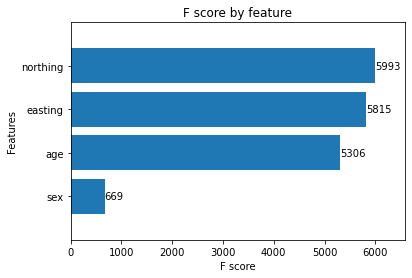

In [13]:
ax = xgb.plot_importance(model, height=.8)
ax.grid(False)
ax.set_title('F score by feature')
plt.show()

We can also pull out individual trees within the model and see exactly which decisions it uses for its contributions to the ensemble. Notice that as with all ensemble methods, individual trees may not appear to produce major differences in outcomes (values on the leaf nodes); the aggregation of often individually-weak trees into a strong model gives XGBoost its power.

Try changing `num_trees` to examine different trees in the model. Changing `rankdir` to `'TB'` will reorient the trees to top-down.

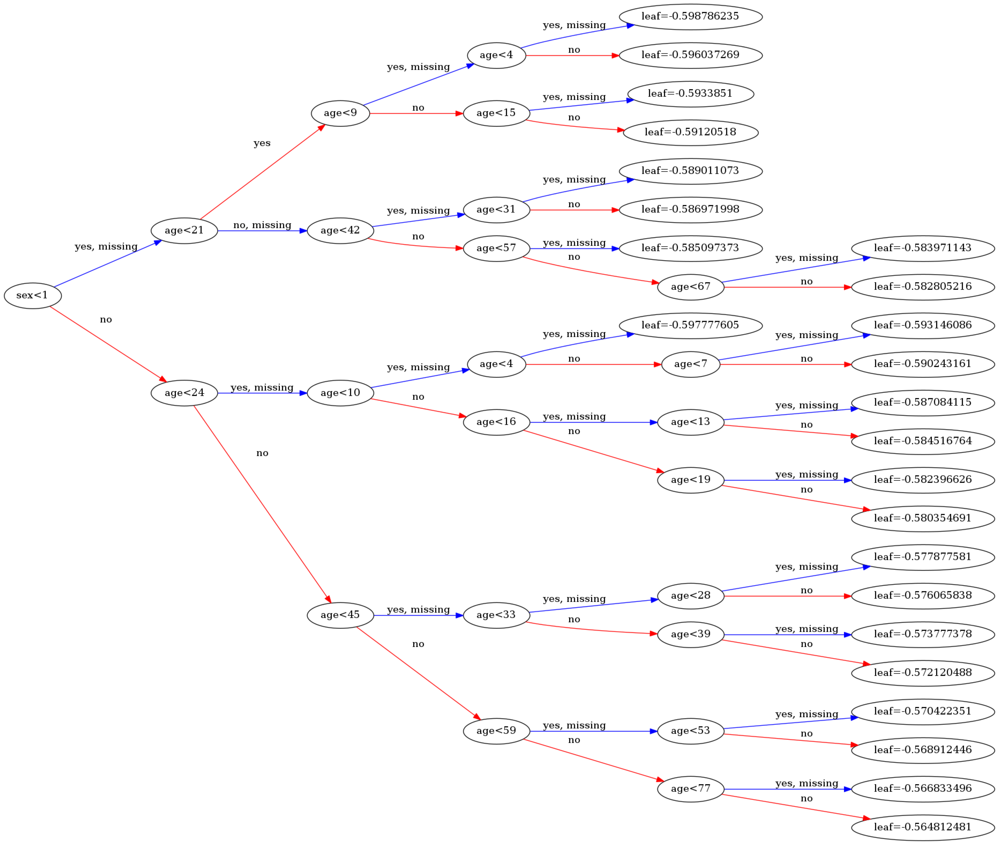

In [14]:
xgb.plot_tree(model, num_trees=0, rankdir='LR')

# get current figure to set the size
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(100, 100)

## Making Predictions

Once we are comfortable with the model, we move to making predictions with it. We confirm that we will be making predictions on over 11 million rows of data.

In [15]:
x_test.shape

(14619974, 4)

We convert the *X* matrix to a `DMatrix` as before, then make a prediction for each row. Notice the amount of time it takes to make over 11 million predictions.

In [16]:
dtest = xgb.DMatrix(x_test)
%time y_pred = model.predict(dtest)

CPU times: user 332 ms, sys: 200 ms, total: 532 ms
Wall time: 534 ms


Now we would like to see how good those predictions were. One common evaluation method is to calculate the area under the curve (AUC) of the receiver operating characteristic (ROC) curve.

The predictions are a `numpy` array, so we convert the test labels to match, then run the ROC curve calculation.

In [17]:
y_test_cpu = cp.asnumpy(cp.array(y_test))
false_pos_rate, true_pos_rate, thresholds = roc_curve(y_test_cpu, y_pred)

Last, we can plot the curve and calculate the AUC score to help us assess the tradeoffs between true and false positive rates.

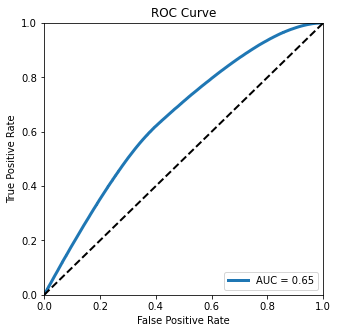

In [18]:
auc_result = auc(false_pos_rate, true_pos_rate)

fig, ax = plt.subplots(figsize=(5, 5))
ax.plot(false_pos_rate, true_pos_rate, lw=3,
        label='AUC = {:.2f}'.format(auc_result))
ax.plot([0, 1], [0, 1], 'k--', lw=2)
ax.set(
    xlim=(0, 1),
    ylim=(0, 1),
    title="ROC Curve",
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
)
ax.legend(loc='lower right');
plt.show()

### Comparison: CPU-only XGBoost

Below is the code for training and inferring from a CPU-only XGBoost using the same model parameters other than switching the histogram tree method from GPU to CPU. 

In [19]:
params['tree_method'] = 'hist'
dtrain_cpu = xgb.DMatrix(x_train.to_pandas(), y_train.to_pandas())
%time model_cpu = xgb.train(params, dtrain_cpu, num_boost_round=100)

CPU times: user 1h 12min 3s, sys: 3.63 s, total: 1h 12min 6s
Wall time: 2min 1s


In [20]:
dtest_cpu = xgb.DMatrix(x_test.to_pandas())
%time y_pred_cpu = model_cpu.predict(dtest_cpu)

CPU times: user 1min 7s, sys: 60 ms, total: 1min 7s
Wall time: 1.52 s


# cuGraph Single Source Shortest Path

Here we use GPU-accelerated graph analytics with cuGraph to identify the shortest path from node on the road network to every other node, both by distance, which we will demo, and by time, which you will implement. You will also visualize the results of your findings.

In [4]:
import cudf
import cugraph as cg

import cuxfilter as cxf
from bokeh.palettes import Magma, Turbo256, Plasma256, Viridis256

We start by loading the road graph data you prepared for constructing a graph with cuGraph, with the long unique `nodeid` replaced with simple (and memory-efficient) integers we call the `graph_id`.

In [5]:
road_graph = cudf.read_csv('./data/road_graph_2-09.csv', dtype=['int32', 'int32', 'float32'])
road_graph.head()

,src,dst,length
0,0,129165,44.0
1,1,1678323,70.0
2,1,2372610,18.0
3,1,2483057,40.0
4,2,2,55.0


Next we load the graph-ready data you prepared that uses amount of time traveled as edge weight.

In [6]:
speed_graph = cudf.read_csv('./data/road_graph_speed_2-09.csv', dtype=['int32', 'int32', 'float32'])
speed_graph.head()

,src,dst,length_s
0,0,129165,3.280848
1,1,1678323,5.219531
2,1,2372610,1.342165
3,1,2483057,2.982589
4,2,2,4.101060


Finally we import the full `road_nodes` dataset, which we will use below for visualizations.

In [7]:
road_nodes = cudf.read_csv('./data/road_nodes_2-09.csv', dtype=['str', 'float32', 'float32', 'str'])
road_nodes = road_nodes.drop_duplicates() # again, some road nodes appeared on multiple map tiles in the original source
road_nodes.head()

,node_id,east,north,type
2589119,id000000F5-5180-4C03-B05D-B01352C54F89,432920.250,572547.375000,road end
1954117,id000003F8-9E09-4829-AD87-6DA4438D22D8,526616.375,189678.390625,junction
873541,id000010DA-C89A-4198-847A-6E62815E038A,336879.000,731824.000000,junction
1346912,id000017A0-1843-4BC7-BCF7-C943B6780839,380635.000,390153.000000,junction
1553458,id00001B2A-155F-4CD3-8E06-7677ADC6AF74,337481.000,350509.687500,junction


In [8]:
road_nodes.shape

(3078117, 4)

In [9]:
speed_graph.src.max()

3078116

## Constructing Graph with cuGraph

Now that we have the well-prepped `road_graph` data, we pass it to cuGraph to create our graph datastructure, which we can then use for accelerated analysis. In order to do so, we first use cuGraph to instantiate a `Graph` instance, and then pass the instance edge sources, edge destinations, and edge weights, currently the length of the roads.

In [10]:
G = cg.Graph()
%time G.from_cudf_edgelist(road_graph, source='src', destination='dst', edge_attr='length')

CPU times: user 424 ms, sys: 80 ms, total: 504 ms
Wall time: 508 ms


## Analyzing the Graph

First, we check the number of nodes and edges in our graph:

In [11]:
G.number_of_nodes()

3078117

In [12]:
G.number_of_edges()

3620793

We can also analyze the degrees of our graph nodes. We would expect, as before, that every node would have a degree of 2 or higher, since undirected edges count as two edges (one in, one out) for each of their nodes.

In [13]:
deg_df = G.degree()
deg_df['degree'].describe()[1:]

mean     4.689990
std      1.913452
min      2.000000
25%      2.000000
50%      6.000000
75%      6.000000
max     16.000000
Name: degree, dtype: float64

We would also expect that every degree would be a multiple of 2, for the same reason. We check that there are no nodes with odd degrees (that is, degrees with a value of 1 modulo 2):

In [14]:
deg_df[deg_df['degree'].mod(2) == 1]

,degree,vertex


Observe for reference that some roads loop from a node back to itself:

In [15]:
road_graph.loc[road_graph.src == road_graph.dst]

,src,dst,length
4,2,2,55.0
145,62,62,108.0
293,124,124,67.0
471,196,196,26.0
571,240,240,44.0
...,...,...,...
7216602,3077469,3077469,78.0
7216735,3077519,3077519,111.0
7216849,3077567,3077567,69.0
7217091,3077670,3077670,30.0


## Single Source Shortest Path

To use the Single Source Shortest Path (SSSP) algorithm, we will start with the node with the highest degree. First we obtain its `graph_id`, reported by the `degree` method as `vertex`:

In [16]:
demo_node = deg_df.nlargest(1, 'degree')
demo_node_graph_id = demo_node['vertex'].iloc[0]
demo_node_graph_id

652907

We can now call `cg.sssp`, passing it the entire graph `G`, and the `graph_id` for our selected vertex. Doing so will calculate the shortest path, using the road length weights we have provided, to *every* other node in the graph - millions of paths, in seconds:

In [17]:
%time shortest_distances_from_demo_node = cg.sssp(G, demo_node_graph_id)
shortest_distances_from_demo_node.head()

CPU times: user 7 s, sys: 5.57 s, total: 12.6 s
Wall time: 12.6 s


,distance,vertex,predecessor
0,254558.0,298588,1837336
1,156232.0,298590,2173677
2,153045.0,298607,429706
3,746972.0,298668,1653769
4,374865.0,298686,2100426


In [18]:
# Limiting to those nodes that were connected (within ~4.3 billion meters because
# cg.sssp uses the max int value for unreachable nodes, such as those on different islands)
shortest_distances_from_demo_node['distance'].loc[shortest_distances_from_demo_node['distance'] < 2**32].describe()[1:]

mean    209942.046612
std     137073.103410
min          0.000000
25%     124952.000000
50%     181649.000000
75%     252309.000000
max     868580.000000
Name: distance, dtype: float64

## Analyzing a Graph with Time Weights

Here we analyze the graph of GB's roads, but this time, instead of using raw distance for a road's weights, you will be using how long it will take to travel along the road.

### Step 1: Constructing the Graph

Construct a cuGraph graph called `G_ex` using the sources and destinations found in `speed_graph`, along with length in seconds values for the edges' weights.

In [19]:
G_ex = cg.Graph()
G_ex.from_cudf_edgelist(speed_graph, source='src', destination='dst', edge_attr='length_s')

### Step 2: Getting Travel Times From a Node to All Others

Choose one of the nodes and calculate the time it would take to travel from it to all other nodes via SSSP, calling the results `ex_dist`.

In [21]:
# If you have time, see what the SSSP visualization looks like starting from nodes at different extreme coordinates,
# or one of the end nodes of an especially long edge, or even one of the nodes unreachable from the main road network.
ex_deg = G_ex.degree()
ex_node = ex_deg.nlargest(1, 'degree')

%time ex_dist = cg.sssp(G_ex, ex_node['vertex'].iloc[0])

# limiting to those nodes that were connected (within ~4.3 billion seconds; .sssp uses the max int value for unconnected nodes)
ex_dist['distance'].loc[ex_dist['distance'] < 2**32].describe()[1:]

CPU times: user 2.22 s, sys: 1.7 s, total: 3.92 s
Wall time: 3.91 s


mean     7416.267095
std      4664.674463
min         0.000000
25%      4478.059570
50%      6439.847168
75%      9051.517578
max     31420.681641
Name: distance, dtype: float64

### Step 3: Visualizing the Node Travel Times

In order to create a graphic showing the road network by travel time from the selected node, we first need to align the just-calculated distances with their original nodes. For that, we use the mapping from `node_id` strings to their `graph_id` integers.

In [23]:
mapping = cudf.read_csv('./data/node_graph_map.csv')
mapping.head()

,node_id,graph_id
0,id000000F5-5180-4C03-B05D-B01352C54F89,0
1,id000003F8-9E09-4829-AD87-6DA4438D22D8,1
2,id000010DA-C89A-4198-847A-6E62815E038A,2
3,id000017A0-1843-4BC7-BCF7-C943B6780839,3
4,id00001B2A-155F-4CD3-8E06-7677ADC6AF74,4


We see that the `sssp` algorithm has put the `graph_id`s in the `vertex` column, so we will merge on that.

In [24]:
ex_dist.head()

,distance,vertex,predecessor
0,6938.548340,743941,2385832
1,6590.082520,743946,2273552
2,3065.079346,744053,798832
3,10593.126953,744113,1609775
4,9084.866211,744173,2526543


In [25]:
road_nodes = road_nodes.merge(mapping, on='node_id')
road_nodes = road_nodes.merge(ex_dist, left_on='graph_id', right_on='vertex')
road_nodes.head()

,node_id,east,north,type,graph_id,distance,vertex,predecessor
0,id02D41169-F7DD-422B-997B-F81C2153DBE8,489775.250000,126843.742188,junction,34112,7.778715e+03,34112,2132494
1,id02D415AE-D5B6-4E66-B254-0D694D47E9C9,485414.000000,161050.000000,junction,34113,6.369708e+03,34113,439613
2,id02D422A9-0627-4A0E-B6F6-A608A9E1AEA7,347374.812500,868192.250000,junction,34114,3.402823e+38,34114,-1
3,id02D4266A-BB93-4B06-B87C-24E03B4A761A,341617.468750,731176.187500,junction,34115,1.781146e+04,34115,1050707
4,id02D42A92-658E-4CAD-B6F5-1F4B2F4ECB48,189171.484375,72671.921875,road end,34116,1.306605e+04,34116,570721


Next, we select those columns we are going to use for the visualization.

For color-scaling purposes, we get rid of the unreachable nodes with their extreme distances, and we invert the distance numbers so that brighter pixels indicate closer locations.

In [26]:
gdf = road_nodes[['east', 'north', 'distance']]
gdf = gdf[gdf['distance'] < 2**32]
gdf['distance'] = gdf['distance'].pow(1/2).mul(-1)

Otherwise, this visualization will be largely similar to the scatterplots we made to visualize the population, but instead of coloring by point density as in those cases, we will color by mean travel time to the nodes within a pixel.

In [27]:
cxf_data = cxf.DataFrame.from_dataframe(gdf)

In [28]:
chart_width = 600
heatmap_chart = cxf.charts.datashader.scatter(x='east', y='north', 
                                              width=chart_width, 
                                              height=int((gdf['north'].max() - gdf['north'].min()) / 
                                                         (gdf['east'].max() - gdf['east'].min()) *
                                                          chart_width),
                                              #palettes=Plasma256, # try also Turbo256, Viridis256, Magma
                                              #pixel_shade_type='linear', # can also be log, cbrt
                                              aggregate_col='distance',
                                              aggregate_fn='mean',
                                              #point_shape='square',
                                              point_size=1)

In [29]:
dash = cxf_data.dashboard([heatmap_chart], theme=cxf.themes.dark, data_size_widget=True)

heatmap_chart.view()

Card(sizing_mode='stretch_both', title='Scatter plot f..., width=600)
    [0] Bokeh(Figure)

In [30]:
%%js
var host = window.location.host;
element.innerText = "'http://"+host+"'";

<IPython.core.display.Javascript object>

In [31]:
my_url = 'http://ec2-3-236-214-70.compute-1.amazonaws.com'
dash.show(my_url, port=8789)

Dashboard running at port 8789


Row(sizing_mode='stretch_both')
    [0] Button(button_type='success', name='open cuxfilter d..., sizing_mode='stretch_both')

In [32]:
%%js
var host = window.location.host;
var url = 'http://'+host+'/lab/proxy/8789/';
element.innerHTML = '<a style="color:blue;" target="_blank" href='+url+'>Open Dashboard</a>';

<IPython.core.display.Javascript object>

In [33]:
dash.stop()